# Exploratory analysis of identifier tokenization properties in relation to naturalness classification

```
Copyright 2024 Kyle Luoma

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    http://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
```

In [12]:
import src.util.callgpt as callgpt
import os
import pandas as pd
import src.util.load_consolidated_results as lcr

In [13]:
crosswalk_directory = "./data/schema-xwalks/consolidated_and_validated/"
output_directory = "./data/tokenizer_analysis/"
generate_tokens = True
nat_glossary = {
    "N1": "Regular",
    "N2": "Low",
    "N3": "Least",
    "native": "Native"
}
# Token count modifiers are used to avoid counting start / stop tokens
model_token_count_modifiers = {
    "code-bison": -2,
    "code-llama": -1,
    "gpt-35-turbo-16k": 0,
    "gemini": -1
}
model_name_map = {
    "code-bison": "Bison",
    "code-llama": "Llama2",
    "gpt-35-turbo-16k": "GPT",
    "gemini": "Gemini"
}

# Token Generation

### GPT Tokenizer (tiktoken) using BPE

#### Identifier Tokenizing

In [14]:
if generate_tokens:
    output_dfs = []
    for filename in os.listdir(crosswalk_directory):
        if ".xlsx" not in filename or "~" in filename:
            continue
        tokenized_identifiers = [[],[],[]]
        df = pd.read_excel(crosswalk_directory + filename)
        df["N1_tokens"] = df.apply(
            lambda row: callgpt.get_decoded_token_list(row.N1_identifier), 
            axis=1
        )
        df["N1_token_count"] = df.apply(
            lambda row: len(row.N1_tokens) + model_token_count_modifiers["gpt-35-turbo-16k"],
            axis=1
        )
        df["N2_tokens"] = df.apply(
            lambda row: callgpt.get_decoded_token_list(row.N2_identifier), 
            axis=1
        )
        df["N2_token_count"] = df.apply(
            lambda row: len(row.N2_tokens) + model_token_count_modifiers["gpt-35-turbo-16k"],
            axis=1
        )
        df["N3_tokens"] = df.apply(
            lambda row: callgpt.get_decoded_token_list(row.N3_identifier), 
            axis=1
        )
        df["N3_token_count"] = df.apply(
            lambda row: len(row.N3_tokens) + model_token_count_modifiers["gpt-35-turbo-16k"],
            axis=1
        )


        output_dfs.append(df)
    gpt_output_df = pd.concat(output_dfs)
    gpt_output_df.to_excel(output_directory + "identifier-tokens-gpt-35-turbo-16k.xlsx")
else:
    gpt_output_df = pd.read_excel(output_directory + "identifier-tokens-gpt-35-turbo-16k.xlsx")

### Llama Tokenizer (SentencePiece) using BPE

In [15]:
from transformers import AutoTokenizer
import torch
tokenizer = AutoTokenizer.from_pretrained(
    'codellama/CodeLlama-7b-hf',
    device_map='auto',
    torch_dtype=torch.bfloat16,
    )


In [16]:
def get_decoded_token_list(identifier: str, tokenizer: AutoTokenizer) -> list:
    try:
        input_encoded = tokenizer.encode(identifier)
    except TypeError as e:
        print(identifier, e)
        return []

    return [tokenizer.decode(tok) for tok in input_encoded]

In [17]:
if generate_tokens:
    output_dfs = []
    for filename in os.listdir(crosswalk_directory):
        print(filename)
        if ".xlsx" not in filename or "~" in filename:
            continue
        tokenized_identifiers = [[],[],[]]
        df = pd.read_excel(crosswalk_directory + filename)
        df["N1_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N1_identifier, tokenizer), 
            axis=1
        )
        df["N1_token_count"] = df.apply(
            lambda row: len(row.N1_tokens) + model_token_count_modifiers["code-llama"],
            axis=1
        )
        df["N2_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N2_identifier, tokenizer), 
            axis=1
        )
        df["N2_token_count"] = df.apply(
            lambda row: len(row.N2_tokens) + model_token_count_modifiers["code-llama"],
            axis=1
        )
        df["N3_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N3_identifier, tokenizer), 
            axis=1
        )
        df["N3_token_count"] = df.apply(
            lambda row: len(row.N3_tokens) + model_token_count_modifiers["code-llama"],
            axis=1
        )


        output_dfs.append(df)
    llama_output_df = pd.concat(output_dfs)
    llama_output_df.to_excel(output_directory + "identifier-tokens-code-llama.xlsx")
else:
    llama_output_df = pd.read_excel(output_directory + "identifier-tokens-code-llama.xlsx")

NYSED_SRC2022-consolidated-xwalk.xlsx
SBODemoUS-consolidated-xwalk.xlsx
KlamathInvasiveSpecies-consolidated-xwalk.xlsx
ASIS_20161108_HerpInv_Database-consolidated-xwalk.xlsx
CratersWildlifeObservations-consolidated-xwalk.xlsx
PacificIslandLandbirds-consolidated-xwalk.xlsx
NorthernPlainsFireManagement-consolidated-xwalk.xlsx
NTSB-consolidated-xwalk.xlsx
ATBI-consolidated-xwalk.xlsx


### Google Palm2 Tokenizer from WordPiece

In [18]:
if generate_tokens:
    from transformers import AutoTokenizer
    tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
    output_dfs = []
    for filename in os.listdir(crosswalk_directory):
        print(filename)
        if ".xlsx" not in filename or "~" in filename:
            continue
        tokenized_identifiers = [[],[],[]]
        df = pd.read_excel(crosswalk_directory + filename)
        df["N1_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N1_identifier, tokenizer), 
            axis=1
        )
        df["N1_token_count"] = df.apply(
            lambda row: len(row.N1_tokens) + model_token_count_modifiers["code-bison"],
            axis=1
        )
        df["N2_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N2_identifier, tokenizer), 
            axis=1
        )
        df["N2_token_count"] = df.apply(
            lambda row: len(row.N2_tokens) + model_token_count_modifiers["code-bison"],
            axis=1
        )
        df["N3_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N3_identifier, tokenizer), 
            axis=1
        )
        df["N3_token_count"] = df.apply(
            lambda row: len(row.N3_tokens) + model_token_count_modifiers["code-bison"],
            axis=1
        )


        output_dfs.append(df)
    bison_output_df = pd.concat(output_dfs)
    bison_output_df.to_excel(output_directory + "identifier-tokens-code-bison.xlsx")
else:
    bison_output_df = pd.read_excel(output_directory + "identifier-tokens-code-bison.xlsx")

NYSED_SRC2022-consolidated-xwalk.xlsx
SBODemoUS-consolidated-xwalk.xlsx
KlamathInvasiveSpecies-consolidated-xwalk.xlsx
ASIS_20161108_HerpInv_Database-consolidated-xwalk.xlsx
CratersWildlifeObservations-consolidated-xwalk.xlsx
PacificIslandLandbirds-consolidated-xwalk.xlsx
NorthernPlainsFireManagement-consolidated-xwalk.xlsx
NTSB-consolidated-xwalk.xlsx
ATBI-consolidated-xwalk.xlsx


### Gemma 2 (Gemini surrogate) tokenizer

In [20]:
if True:
    from transformers import AutoTokenizer
    import json
    with open("./.local/huggingface.json") as hf_json_file:
        hf_info = json.loads(hf_json_file.read())
    tokenizer = AutoTokenizer.from_pretrained(
        "google/gemma-7b",
        token=hf_info["token"]
        )
    output_dfs = []
    for filename in os.listdir(crosswalk_directory):
        print(filename)
        if ".xlsx" not in filename or "~" in filename:
            continue
        tokenized_identifiers = [[],[],[]]
        df = pd.read_excel(crosswalk_directory + filename)
        df["N1_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N1_identifier, tokenizer), 
            axis=1
        )
        df["N1_token_count"] = df.apply(
            lambda row: len(row.N1_tokens) + model_token_count_modifiers["gemini"],
            axis=1
        )
        df["N2_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N2_identifier, tokenizer), 
            axis=1
        )
        df["N2_token_count"] = df.apply(
            lambda row: len(row.N2_tokens) + model_token_count_modifiers["gemini"],
            axis=1
        )
        df["N3_tokens"] = df.apply(
            lambda row: get_decoded_token_list(row.N3_identifier, tokenizer), 
            axis=1
        )
        df["N3_token_count"] = df.apply(
            lambda row: len(row.N3_tokens) + model_token_count_modifiers["gemini"],
            axis=1
        )


        output_dfs.append(df)
    gemini_output_df = pd.concat(output_dfs)
    gemini_output_df.to_excel(output_directory + "identifier-tokens-gemini.xlsx")
else:
    gemini_output_df = pd.read_excel(output_directory + "identifier-tokens-gemini.xlsx")

NYSED_SRC2022-consolidated-xwalk.xlsx
SBODemoUS-consolidated-xwalk.xlsx
KlamathInvasiveSpecies-consolidated-xwalk.xlsx
ASIS_20161108_HerpInv_Database-consolidated-xwalk.xlsx
CratersWildlifeObservations-consolidated-xwalk.xlsx
PacificIslandLandbirds-consolidated-xwalk.xlsx
NorthernPlainsFireManagement-consolidated-xwalk.xlsx
NTSB-consolidated-xwalk.xlsx
ATBI-consolidated-xwalk.xlsx


### Question and Query Tokenizing for All Models

In [ ]:
import json
import  src.util.load_nl_questions as lnq
from transformers import AutoTokenizer
db_info = json.loads(open(".local/dbinfo.json").read())
databases = [db["database"] for db in db_info if "SBO" not in db["database"]]
# databases = [db["database"] for db in db_info if "SBO" not in db["database"]]
modules = [
    "Banking", "Business Partners", "Finance", "General", 
    "Human Resources", "Inventory and Production", "Reports", 
    "Sales Opportunities", "Service"
    ]
module_encoder = {}
module_encoder[""] = 0
for i in range(0, len(modules)):
    module_encoder[modules[i]] = (i + 1) * 1000
for module in modules:
    databases.append(f"SBODemoUS-{module}")
db_xwalks = {}
for db in (databases + ["SBODemoUS"]):
    if "-" in db:
        continue
    temp_df = pd.read_excel(
        crosswalk_directory + db + "-consolidated-xwalk.xlsx"
        )
    temp_df["native_identifier_upper"] = temp_df["native_identifier"].str.upper()
    db_xwalks[db] = temp_df.set_index(['table_or_column', 'native_identifier_upper'])
tokenizers = {}
tokenizers["code-bison"] = AutoTokenizer.from_pretrained("bert-base-uncased")
tokenizers["code-llama"] = AutoTokenizer.from_pretrained(
    'codellama/CodeLlama-7b-hf',
    device_map='auto',
    torch_dtype=torch.bfloat16,
    )
import json
with open("./.local/huggingface.json") as hf_json_file:
    hf_info = json.loads(hf_json_file.read())
tokenizers["gemini"] = AutoTokenizer.from_pretrained(
        "google/gemma-7b",
        token=hf_info["token"]
        )

#### Tokenize the NL questions

In [26]:
db_questions = []
for db in databases:
    for model in ["code-bison", "code-llama", "gpt-35-turbo-16k", "gemini"]:
        questions = lnq.load_nlq_into_df(f"{db}.sql")
        questions["database"] = db
        questions["model"] = model
        if model == "gpt-35-turbo-16k":
            questions["question_tokens"] = questions.apply(
                lambda row: callgpt.get_decoded_token_list(row.question),
                axis=1
            )
        else:
            questions["question_tokens"] = questions.apply(
                lambda row: get_decoded_token_list(
                    row.question,
                    tokenizers[model]
                ),
                axis=1
            )
        db_questions.append(questions)
questions_df = pd.concat(db_questions)
questions_df.to_excel(output_directory + "question-tokens-all-models.xlsx")

Unzipping NL-SQL Gold Queries into ./db/queries/


FileNotFoundError: [Errno 2] No such file or directory: './db/queries/na.sql'

In [ ]:
combine_models = True

In [ ]:
if combine_models:
    model_dfs = []
    for filename in os.listdir(output_directory):
        if "~" in filename or "identifier-tokens" not in filename or "all-models" in filename:
            continue
        model = "-".join(filename.split("-")[2:]).replace(".xlsx", "")
        model_df = pd.read_excel(output_directory + filename)
        model_df['model'] = model
        model_dfs.append(model_df)
    all_models = pd.concat(model_dfs)
    all_models.to_excel(output_directory + "identifier-tokens-all-models.xlsx")
else:
    all_models = pd.read_excel(output_directory + "identifier-tokens-all-models.xlsx")
all_models['model_label'] = all_models.model.apply(lambda x: model_name_map[x])

#### Tokenize the Prompts

In [ ]:
loader = lcr.ConsolidatedResultsLoader()
prompts = loader.load_annotation_files()[["database", "number", "col_naturalness_modifier", "prompt"]]
prompts = prompts.drop_duplicates(subset=["database", "number", "col_naturalness_modifier"])

In [ ]:
if True:
    from tqdm import tqdm
    prompt_token_df = pd.DataFrame({
        "database": [],
        "number": [],
        "naturalness": [],
        "tokenizer_model": [],
        "prompt_token_count": []
    })
    prompt_models = []
    tokens = []
    token_count = []
    for row in tqdm(prompts.itertuples(), total=prompts.shape[0]):
        new_row = {}
        new_row["database"] = [row.database]
        new_row["number"] = [row.number]
        new_row["naturalness"] = [row.col_naturalness_modifier]
        for model in ["code-bison", "code-llama", "gpt-35-turbo-16k", "gemini"]:
            new_row["tokenizer_model"] = [model]
            if model == "gpt-35-turbo-16k":
                prompt_tokens = callgpt.get_decoded_token_list(row.prompt)
            else:
                prompt_tokens = get_decoded_token_list(row.prompt, tokenizers[model])
            new_row["prompt_token_count"] = [len(prompt_tokens)]
            prompt_token_df = pd.concat([prompt_token_df, pd.DataFrame(new_row)])
    prompt_token_df.to_excel(output_directory + "prompts_tokenized.xlsx")

100%|██████████| 2475/2475 [02:38<00:00, 15.60it/s]


#### Tokenize the Database Identifiers in the Gold Queries

In [ ]:
import query_profiler as qp
from collections import defaultdict
from tqdm import tqdm
import pickle
profile_queries = False
try:
    with open("query_idents.pickle", "rb") as f:
        query_idents = pickle.load(f)
except Exception as e:
    print(e)
    profile_queries = True

if profile_queries:
    profiler = qp.QueryProfiler()
    query_idents = defaultdict(list)
    unique_questions_df = questions_df[[
                "database", "number", "query_gold"
            ]].drop_duplicates().dropna(how="all")
    for row in tqdm(
            unique_questions_df.itertuples(),
            total=unique_questions_df.shape[0]
        ):
        labels = profiler.get_identifiers_and_labels(
            row.query_gold,
            include_brackets=False
        )
        query_idents[(row.database, row.number)] = {"tables": labels["tables"], "columns": labels["columns"]}
    with open("query_idents.pickle", "wb") as f:
        pickle.dump(query_idents, f, pickle.HIGHEST_PROTOCOL)


In [ ]:
ident_type = "table"
ident = "AIRBAG"
db_xwalks["NTSB"].loc[ident_type, ident]["N3_identifier"]

'ABG'

In [ ]:
query_tokens_df = pd.DataFrame({
    "model": [],
    "database": [],
    "question": [],
    "table_or_column": [],
    "native_identifier": [],
    "native_tokens": [],
    "N1_identifier": [],
    "N1_tokens": [],
    "N2_identifier": [],
    "N2_tokens": [],
    "N3_identifier": [],
    "N3_tokens": []
})
for query in tqdm(query_idents.keys()):
    query_db = query[0]
    xwalk_lookup_db = query[0].split("-")[0]
    idents = {
        "table": query_idents[query]["tables"], 
        "column": query_idents[query]["columns"]
        }
    for ident_type in idents.keys():
        for ident in idents[ident_type]:
            if ident not in db_xwalks[xwalk_lookup_db].loc[ident_type].index:
                continue
            native_ident = db_xwalks[xwalk_lookup_db].loc[ident_type, ident]["native_identifier"]
            N1_ident = db_xwalks[xwalk_lookup_db].loc[ident_type, ident]["N1_identifier"]
            N2_ident = db_xwalks[xwalk_lookup_db].loc[ident_type, ident]["N2_identifier"]
            N3_ident = db_xwalks[xwalk_lookup_db].loc[ident_type, ident]["N3_identifier"]
            for model in ["code-bison", "code-llama", "gpt-35-turbo-16k", "gemini"]:
                if model == "gpt-35-turbo-16k":
                    native_tokens = callgpt.get_decoded_token_list(native_ident)
                    N1_tokens = callgpt.get_decoded_token_list(N1_ident)
                    N2_tokens = callgpt.get_decoded_token_list(N2_ident)
                    N3_tokens = callgpt.get_decoded_token_list(N3_ident)
                else:
                    native_tokens = get_decoded_token_list(
                            native_ident,
                            tokenizers[model]
                        )
                    N1_tokens = get_decoded_token_list(
                            N1_ident,
                            tokenizers[model]
                        )
                    N2_tokens = get_decoded_token_list(
                            N2_ident,
                            tokenizers[model]
                        )
                    N3_tokens = get_decoded_token_list(
                            N3_ident,
                            tokenizers[model]
                        )
                query_tokens_df = pd.concat(
                    [
                        query_tokens_df,
                        pd.DataFrame({
                            "model": [model],
                            "database": [query_db],
                            "question": [query[1]],
                            "table_or_column": ident_type,
                            "native_identifier": [native_ident],
                            "native_tokens": [native_tokens],
                            "N1_identifier": [N1_ident],
                            "N1_tokens": [N1_tokens],
                            "N2_identifier": [N2_ident],
                            "N2_tokens": [N2_tokens],
                            "N3_identifier": [N3_ident],
                            "N3_tokens": [N3_tokens]
                        })
                    ]
                )
query_tokens_df.to_excel(output_directory + "query-tokens-all-models.xlsx")

100%|██████████| 503/503 [00:08<00:00, 62.03it/s] 


# Token Analysis

#### Make some additional columns:

Column to list the native token, pulls from one of three naturalness level columns

In [ ]:
all_models["native_tokens"] = all_models.apply(
    lambda row: row["{}_tokens".format(row.native_naturalness)] if row.native_naturalness in ("N1", "N2", "N3") else [],
    axis=1
)

Column to count native tokens

In [ ]:
all_models["native_token_count"] = all_models.apply(
    lambda row: row["{}_token_count".format(row.native_naturalness)] if row.native_naturalness in ("N1", "N2", "N3") else 0,
    axis=1
)

Character count columns

In [ ]:
for level in ("native", "N1", "N2", "N3"):
    all_models[f"{level}_char_count"] = all_models.apply(
        lambda row: len(row[f"{level}_identifier"]) if type(row[f"{level}_identifier"]) == str else 0,
        axis=1
    )

Ratio of tokens : characters

In [ ]:
for level in ("native", "N1", "N2", "N3"):
    all_models[f"{level}_identifier_token_char_ratio"] = all_models.apply(
        lambda row: row[f"{level}_token_count"] / row[f"{level}_char_count"] if row[f"{level}_char_count"] > 0 else -1,
        axis=1
    )

In [ ]:
all_models.to_excel(
    output_directory + "identifier-tokens-all-models.xlsx", 
    index=False
    )

#### Average gold query token : char ratios

In [ ]:
query_ident_ratio_df = pd.DataFrame({
    "model": [],
    "database": [],
    "question_number": [],
    "naturalness": [],
    "mean_token_char_ratio": []
})
ratio_lookup = all_models.copy()
ratio_lookup["native_identifier_upper"] = ratio_lookup.native_identifier.str.upper()
ratio_lookup = ratio_lookup.set_index(["source_database", "native_identifier_upper", "model"])
ratio_lookup = ratio_lookup.sort_index()
# query_idents[(row.database, row.number)]
for naturalness in ["native", "N1", "N2", "N3"]:
    for model in model_token_count_modifiers.keys():
        print(naturalness, model)
        for q in tqdm(query_idents):
            if type(q) != tuple:
                continue
            new_row = {}
            database = q[0]
            ratio_lookup_db = database.split("-")[0]
            question_number = q[1]
            ratio_sum = 0
            ident_count = 0
            for table in query_idents[q]["tables"]:
                if table not in ratio_lookup.loc[ratio_lookup_db].reset_index().native_identifier_upper.to_list():
                    continue
                ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"].loc[0]
                ident_count += 1
            for column in query_idents[q]["columns"]:
                if column not in ratio_lookup.loc[ratio_lookup_db].reset_index().native_identifier_upper.to_list():
                    continue
                ratio_sum += ratio_lookup.loc[ratio_lookup_db, column, model][f"{naturalness}_identifier_token_char_ratio"].loc[0]
                ident_count += 1
            try:
                mean = ratio_sum / (ident_count)
            except ZeroDivisionError as e:
                print(q, e)
            new_row["model"] = [model]
            new_row["database"] = [database]
            new_row["question_number"] = [question_number]
            new_row["naturalness"] = [naturalness]
            new_row["mean_token_char_ratio"] = [mean]
            query_ident_ratio_df = pd.concat([query_ident_ratio_df, pd.DataFrame(new_row)])
query_ident_ratio_df.to_excel(output_directory + "query-token-char-ratios.xlsx", index=False)

native code-bison


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

native code-llama


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

native gpt-35-turbo-16k


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

native gemini


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N1 code-bison


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N1 code-llama


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N1 gpt-35-turbo-16k


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N1 gemini


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N2 code-bison


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N2 code-llama


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N2 gpt-35-turbo-16k


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N2 gemini


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N3 code-bison


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N3 code-llama


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N3 gpt-35-turbo-16k


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

N3 gemini


  0%|          | 0/503 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ratio_sum += ratio_lookup.loc[ratio_lookup_db, table, model][f"{naturalness}_identifier_token_char_ratio"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\2550579899.py:33: FutureWarning: Series.__getitem__ treating keys as positi

### Character and Token CDFs of database identifiers

['Native', 'Regular', 'Low', 'Least']


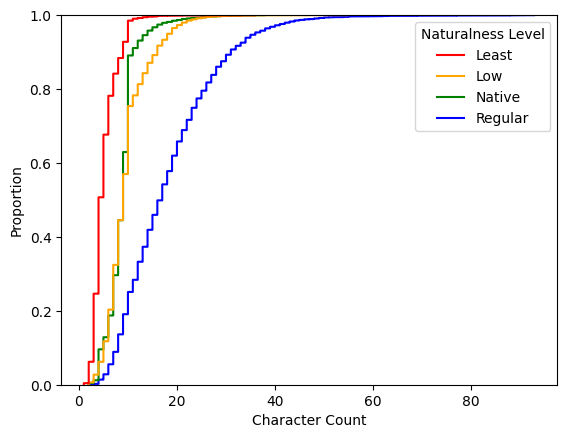

In [ ]:
import seaborn as sns
columns = [f"{nat}_char_count" for nat in ["native", "N1", "N2", "N3"]]
charcount_cdf_df = all_models[columns]
val_cols = [f"{nat_glossary[col.split('_')[0]]}".strip() for col in columns]
print(val_cols)
charcount_cdf_df = charcount_cdf_df.rename(columns={
    columns[i]: val_cols[i] for i in range(0, len(val_cols))
    })
charcount_cdf_df = charcount_cdf_df.melt(
    value_vars=val_cols,
    value_name="Character Count",
    var_name="Naturalness Level"
    ).sort_values(by="Naturalness Level")
g = sns.ecdfplot(
    data=charcount_cdf_df, 
    x="Character Count", 
    hue="Naturalness Level",
    palette=["red", "orange", "green", "blue"]
    )
# for line, style, handle in zip(g.lines[::-1], [":", "--", "-.", "-"], g.legend_.legendHandles):
#     line.set_linestyle(style)
#     handle.set_linestyle(style)
g.figure.savefig("./figure_output/identifier-char-count-cdf.pdf")

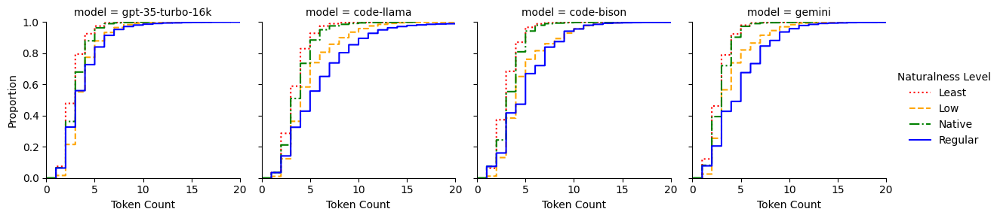

In [ ]:
columns = ["source_database", "model"] + [f"{nat}_token_count" for nat in ["native", "N1", "N2", "N3"]]
val_cols = [f"{nat_glossary[col.split('_')[0]]}".strip() for col in columns[2:]]
tokencount_cdf_df = all_models[columns]
tokencount_cdf_df = tokencount_cdf_df.rename(columns={
    columns[i]: val_cols[i - 2] for i in range(2, len(columns))
})
tokencount_cdf_df = tokencount_cdf_df.melt(
    id_vars=["source_database", "model"],
    value_vars=val_cols,
    value_name="Token Count",
    var_name="Naturalness Level"
).sort_values(by="Naturalness Level")
g = sns.FacetGrid(
    tokencount_cdf_df, 
    col="model", 
    hue="Naturalness Level", 
    xlim=(0, 20),
    palette=["red", "orange", "green", "blue"]
    )
g.map(sns.ecdfplot, "Token Count")
for ax in g.axes.flat:
    for line, style in zip(ax.lines[::-1], [":", "--", "-.", "-"][::-1]):
        line.set_linestyle(style)
g.add_legend()
g.savefig("./figure_output/identifier-token-count-cdf.pdf")

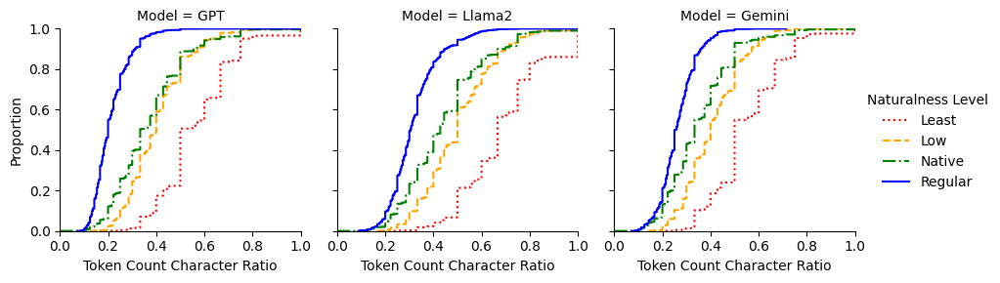

In [ ]:
columns = ["source_database", "model_label"] + [f"{nat}_identifier_token_char_ratio" for nat in ["native", "N1", "N2", "N3"]]
val_cols = [f"{nat_glossary[col.split('_')[0]]}".strip() for col in columns[2:]]
ratio_cdf_df = all_models[columns]
ratio_cdf_df = ratio_cdf_df.rename(columns={
    columns[i]: val_cols[i - 2] for i in range(2, len(columns))
})
ratio_cdf_df = ratio_cdf_df.rename(columns={"model_label": "Model"})
ratio_cdf_df = ratio_cdf_df.query("Model != 'Bison'").melt(
    id_vars=["source_database", "Model"],
    value_vars=val_cols,
    value_name="Token Count Character Ratio",
    var_name="Naturalness Level"
).sort_values(by="Naturalness Level")
g = sns.FacetGrid(
    ratio_cdf_df, 
    col="Model", 
    hue="Naturalness Level", 
    xlim=(0,1),
    palette=["red", "orange", "green", "blue"]
    )
g.map(sns.ecdfplot, "Token Count Character Ratio")
for ax in g.axes.flat:
    for line, style in zip(ax.lines[::-1], [":", "--", "-.", "-"][::-1]):
        line.set_linestyle(style)
g.add_legend()
g.savefig("./figure_output/identifier-token-char-ratio-cdf.pdf")

## Question - Query Semantic Similarity

Using embeddings

In [ ]:
from sentence_transformers import SentenceTransformer
import sentence_transformers as st
# Model list:
# https://www.sbert.net/docs/pretrained_models.html#:~:text=%20%20%20%20Model%20Name%20%20,%20120%20MB%20%209%20more%20rows%20
model_name = "all-mpnet-base-v2"
model = SentenceTransformer(model_name)
model.to("cuda")

SentenceTransformer(
  (0): Transformer({'max_seq_length': 384, 'do_lower_case': False}) with Transformer model: MPNetModel 
  (1): Pooling({'word_embedding_dimension': 768, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)

#### Sentence-Level cosine similarity of embeddings

#### Tokenize the NL questions

In [ ]:
sent_ident_similar_df = pd.DataFrame({
    "database": [],
    "question_number": [],
    "embeddings_model": [],
    "question": [],
    "native_identifiers": [],
    "native_cosine_similarity": [],
    "N1_identifiers": [],
    "N1_cosine_similarity": [],
    "N2_identifiers": [],
    "N2_cosine_similarity": [],
    "N3_identifiers": [],
    "N3_cosine_similarity": [],
})
query_ident_df = query_tokens_df[[
    "database", "question", "native_identifier", 
    "N1_identifier", "N2_identifier", "N3_identifier"
    ]].drop_duplicates().dropna(how="all").set_index(['database', 'question']).sort_index()

for row in tqdm(questions_df.reset_index().itertuples(), total=questions_df.shape[0]):
    identifiers = query_ident_df.loc[row.database, row.number][[
        "native_identifier", 
        "N1_identifier", 
        "N2_identifier", 
        "N3_identifier"
        ]]
    embeddings = model.encode([
        row.question, 
        " ".join(identifiers["native_identifier"]),
        " ".join(identifiers["N1_identifier"]),
        " ".join(identifiers["N2_identifier"]),
        " ".join(identifiers["N3_identifier"])
        ])
    native_similarity = st.util.cos_sim(embeddings[0], embeddings[1])
    N1_similarity = st.util.cos_sim(embeddings[0], embeddings[2])
    N2_similarity = st.util.cos_sim(embeddings[0], embeddings[3])
    N3_similarity = st.util.cos_sim(embeddings[0], embeddings[4])
    sent_ident_similar_df = pd.concat([sent_ident_similar_df, pd.DataFrame({
        "database": [row.database],
        "question_number": [row.number],
        "embeddings_model": [model_name],
        "question": [row.question],
        "native_identifiers": [" ".join(identifiers["native_identifier"])],
        "native_cosine_similarity": [float(native_similarity[0][0])],
        "N1_identifiers": [" ".join(identifiers["N1_identifier"])],
        "N1_cosine_similarity": [float(N1_similarity[0][0])],
        "N2_identifiers": [" ".join(identifiers["N2_identifier"])],
        "N2_cosine_similarity": [float(N2_similarity[0][0])],
        "N3_identifiers": [" ".join(identifiers["N3_identifier"])],
        "N3_cosine_similarity": [float(N3_similarity[0][0])],
    })])
sent_ident_similar_df.to_excel(output_directory + "question-identifier-sentence-similarity.xlsx")

100%|██████████| 2012/2012 [00:22<00:00, 87.85it/s] 


### Word-Level Embeddings and Question - Query Identifier Similarity

Create word level embeddings of words in a question and database identifiers.


In [ ]:
process_embeddings = False
naturalness_db_sim_matrices = {}
try:
    for naturalness in ["native", "N1", "N2", "N3"]:
        with open(f"{naturalness}_database_word_level_embeddings.pickle", "rb") as f:
            naturalness_db_sim_matrices[naturalness] = pickle.load(f)
except Exception as e:
    print(e)
    process_embeddings = True
if process_embeddings:
    for naturalness in ["native", "N1", "N2", "N3"]:
        questions_df = questions_df.reset_index().set_index(["database", "number"])
        questions_df = questions_df.sort_index()
        database_similarity_matrices = {}
        for database in databases:
            print(f"Database:-{database}-")
            database_similarity_matrices[database] = {}
            for question_num in tqdm(query_ident_df.loc[database].index.unique()):
                question = questions_df.loc[database, int(question_num)]["question"][0]
                for punct in [",", ".", "?"]:
                    question = question.replace(punct, "")
                question = list(set(question.split(" ")))
                matrix_df = pd.DataFrame(columns=["identifier"] + question)
                idents = query_ident_df.loc[database, question_num][f"{naturalness}_identifier"].to_list()
                new_row = {}
                for ident in idents:
                    new_row["identifier"] = [ident]
                    for word in question:
                        embeddings = model.encode([word, ident])
                        similarity = [float(st.util.cos_sim(embeddings[0], embeddings[1])[0][0])]
                        new_row[word] = similarity
                    matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
                database_similarity_matrices[database][question_num] = matrix_df
        naturalness_db_sim_matrices[naturalness] = database_similarity_matrices
        with open(f"{naturalness}_database_word_level_embeddings.pickle", "wb") as f:
            pickle.dump(database_similarity_matrices, f, pickle.HIGHEST_PROTOCOL)

[Errno 2] No such file or directory: 'native_database_word_level_embeddings.pickle'
Database:-ATBI-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:38,  1.01it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-PacificIslandLandbirds-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futur

Database:-NorthernPlainsFireManagement-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:05,  6.69it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NTSB-


  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

Database:-CratersWildlifeObservations-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:15,  2.54it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ASIS_20161108_HerpInv_Database-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:05,  7.49it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-KlamathInvasiveSpecies-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:31,  1.24it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NYSED_SRC2022-


  0%|          | 0/63 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▏         | 1/63 [00:01<01:24,  1.36s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Banking-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:01,  6.97it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Business Partners-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:13,  1.49s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Finance-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:05,  1.54it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-General-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:05,  1.78it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Human Resources-


  0%|          | 0/20 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  5%|▌         | 1/20 [00:00<00:16,  1.12it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Inventory and Production-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:21,  2.37s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Reports-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:17,  1.94s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Sales Opportunities-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:12,  1.35s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Service-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:03,  2.73it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ATBI-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:01<00:39,  1.02s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-PacificIslandLandbirds-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futur

Database:-NorthernPlainsFireManagement-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:19,  1.97it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NTSB-


  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  1%|          | 1/100 [00:00<00:32,  3.01it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ trea

Database:-CratersWildlifeObservations-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:01<01:09,  1.78s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ASIS_20161108_HerpInv_Database-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:25,  1.56it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-KlamathInvasiveSpecies-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:02<01:53,  2.91s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NYSED_SRC2022-


  0%|          | 0/63 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▏         | 1/63 [00:05<05:19,  5.15s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Banking-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:04,  1.85it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Business Partners-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:13,  1.49s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Finance-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:21,  2.43s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-General-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:19,  2.17s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Human Resources-


  0%|          | 0/20 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  5%|▌         | 1/20 [00:03<00:59,  3.14s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Inventory and Production-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:21,  2.41s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Reports-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:19,  2.16s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Sales Opportunities-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:12,  1.40s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Service-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:11,  1.25s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ATBI-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:03<02:25,  3.72s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-PacificIslandLandbirds-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:06,  5.87it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NorthernPlainsFireManagement-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:19,  1.96it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NTSB-


  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  1%|          | 1/100 [00:00<00:36,  2.70it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ trea

Database:-CratersWildlifeObservations-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:01<01:12,  1.86s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ASIS_20161108_HerpInv_Database-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:21,  1.85it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-KlamathInvasiveSpecies-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:02<01:51,  2.85s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NYSED_SRC2022-


  0%|          | 0/63 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▏         | 1/63 [00:05<05:24,  5.23s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Banking-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:05,  1.66it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Business Partners-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:15,  1.76s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Finance-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:21,  2.42s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-General-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:19,  2.17s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Human Resources-


  0%|          | 0/20 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  5%|▌         | 1/20 [00:03<00:59,  3.13s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Inventory and Production-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:21,  2.40s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Reports-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:19,  2.21s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Sales Opportunities-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:12,  1.44s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Service-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:12,  1.34s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ATBI-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:03<02:31,  3.88s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-PacificIslandLandbirds-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:07,  5.23it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NorthernPlainsFireManagement-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:19,  2.04it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NTSB-


  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  1%|          | 1/100 [00:00<00:38,  2.60it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ trea

Database:-CratersWildlifeObservations-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:01<01:03,  1.63s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-ASIS_20161108_HerpInv_Database-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:00<00:20,  1.89it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-KlamathInvasiveSpecies-


  0%|          | 0/40 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▎         | 1/40 [00:02<01:51,  2.85s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-NYSED_SRC2022-


  0%|          | 0/63 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  2%|▏         | 1/63 [00:05<05:24,  5.23s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Banking-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:00<00:04,  2.23it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Business Partners-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:13,  1.47s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Finance-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:22,  2.45s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-General-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:19,  2.21s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Human Resources-


  0%|          | 0/20 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
  5%|▌         | 1/20 [00:03<01:00,  3.19s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Inventory and Production-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:20,  2.33s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Reports-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:02<00:19,  2.17s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Sales Opportunities-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:13,  1.48s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Database:-SBODemoUS-Service-


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  question = questions_df.loc[database, int(question_num)]["question"][0]
C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  matrix_df = pd.concat([matrix_df, pd.DataFrame(new_row)])
 10%|█         | 1/10 [00:01<00:12,  1.37s/it]C:\Users\kyle.luoma\AppData\Local\Temp\ipykernel_9288\1187638933.py:19: FutureWarning: Series.__getitem__ treati

Preserve the highest question word-identifier pairing
Do this by 

    iterating through each identifier in a query

    save the max similarity score between the identifier and a sentence word in a word list
    
    average (mean) the max scores for each identifier to generate the mean max score
    

In [ ]:
word_ident_similar_df = pd.DataFrame({
    "database": [],
    "naturalness": [],
    "question_number": [],
    "embeddings_model": [],
    "question": [],
    "mean_max_similarity": []
})

nat_levels = naturalness_db_sim_matrices.keys()
databases = naturalness_db_sim_matrices["native"].keys()

for nat_level in nat_levels:
    database_similarity_matrices = naturalness_db_sim_matrices[nat_level]
    for database in databases:
        question_matrices = database_similarity_matrices[database]
        for question_num in question_matrices:
            question_matrix = question_matrices[question_num]
            words = list(question_matrix.columns)
            words.remove("identifier")
            ident_scores = []
            for row in question_matrix.itertuples():
                max_score = max([x for x in row[2:]])
                ident_scores.append(max_score)
            max_mean = sum(ident_scores) / len(ident_scores)
            new_row = pd.DataFrame({
                "database": [database],
                "naturalness": [nat_level],
                "question_number": [int(question_num)],
                "embeddings_model": [model_name],
                "mean_max_similarity": [max_mean]
            })
            word_ident_similar_df = pd.concat([word_ident_similar_df, new_row])

word_ident_similar_df.to_excel(output_directory + "word-identifier-sentence-similarity.xlsx")

##### Generate heatmaps for all questions (ETA 15 minutes)

Change if statement to True to enable

In [ ]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

nat_levels = naturalness_db_sim_matrices.keys()
databases = naturalness_db_sim_matrices["native"].keys()

if False:
    for database in databases:
        question_nums = naturalness_db_sim_matrices["native"][database].keys()
        print(database)
        for question_num in question_nums:
            question = questions_df.set_index([
                "database", "number"
                ]).loc[database, int(question_num)]["question"][0]
            plt.figure()
            parent_fig, axs = plt.subplots(1, 4, figsize=(12,6), width_ratios=[.23, .23, .23, .31])
            parent_fig.subplots_adjust(left=0.0, right=2.0, top=0.85)
            parent_fig.suptitle(
                f"Database: {database}, Question Number: {int(question_num)}\n{question}",
                y=1.0,
                x=1.0
                )
            for ax_ix, nat_level in enumerate(nat_levels):
                database_similarity_matrices = naturalness_db_sim_matrices[nat_level]
                matrix_df = database_similarity_matrices[database][int(question_num)]
                show_bar = ax_ix == 3
                g = sns.heatmap(
                    matrix_df.set_index("identifier"),
                    linewidths=.5,
                    cmap="viridis",
                    vmin=0,
                    vmax=1,
                    ax=axs[ax_ix],
                    cbar=show_bar
                    ).set(title=f"Naturalness: {nat_level}")
            parent_fig.savefig(
                f"{output_directory}plots/{database}-question-{int(question_num)}-sentence-identifier-similarity-heatmap.png",
                dpi=150,
                bbox_inches="tight"
                )